# 第1章 基礎

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('default')
plt.rcParams['figure.figsize'] = (7, 2)
from IPython.display import display
from IPython.display import Audio
import soundfile as sf

## 1. 音とは

<u>**A. 波**</u>

<br>

例えば

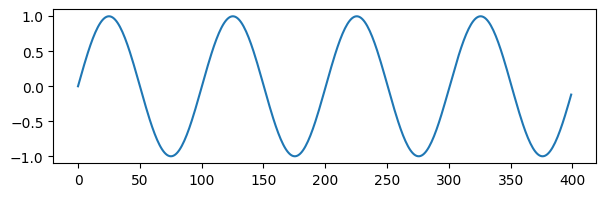

In [ ]:
freq = 440
sr = 44100
sec = 1
amp = 1
y = amp * np.sin(np.linspace(0, 2*np.pi * freq * sec, sr*sec))
plt.plot(y[:400])
Audio(y, rate=sr)

こんな波だとこんな音になる

### デジタル化

もう少し一般的な音声を聴いてみる  
[サンプル音声／無料ダウンロード | ナレーション(アナウンス放送)収録[英語も]](http://pro-video.jp/voice/announce/)

In [ ]:
path = 'sample-sounds/ohayo.wav'
Audio(path)

波形はこんな感じ

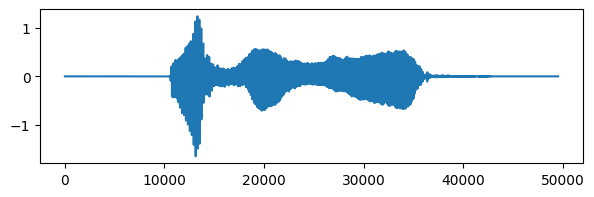

In [ ]:
y, sr = sf.read(path)
plt.plot(y.sum(axis=1));

拡大

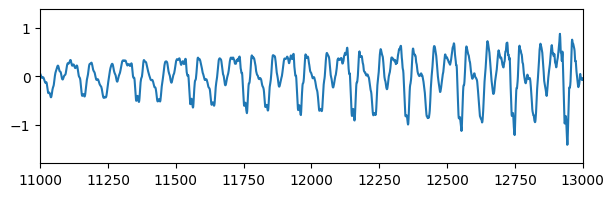

In [ ]:
plt.plot(y.sum(axis=1))
plt.xlim(11000, 13000);

こういう波を数値で表せば、音をコンピュータで扱えそう  
→ 1つ1つの値を並べた1次元の配列としよう

### 音を作る

グラフで表したときに波になるような配列を作ればいい

<br>

先程のsin波の生成を関数化

In [ ]:
def sin_wave(freq=440, sr=44100, amp=1, sec=1):
    return amp * np.sin(np.linspace(0, 2*np.pi * freq * sec, int(sr*sec)))

引数が4つ  
→ **sin波の生成**に必要な要素が4つ

<br>

< 引数の説明 >
- freq : 周波数 (frequency)  
波の細かさを表す数値。1秒間に何回振動するか。この値が大きいと音が高くなる。  
よく使われる変数名 : freq, f

- sr : サンプリングレート (sampling rate)  
１秒間にいくつの値を記録するか。(標本化の際の細かさ。) サンプリング周波数ともいう  
よく使われる変数名 : sr, sf

- amp : 振幅 (amplitude)  
波の大きさを表す数値。縦にどれくらい伸ばすか。この値が大きいと音が大きくなる。音量。  

- sec : 秒数 (second)  
何秒間音を鳴らすか。

<br>

これを使って、音の高さを変えてみる

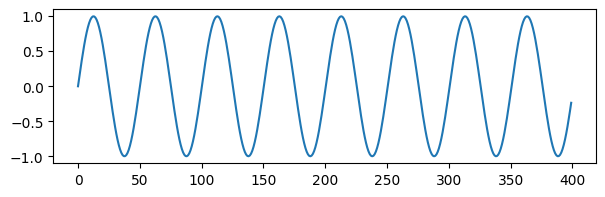

In [ ]:
sr = 44100
y = sin_wave(freq=880, sr=sr)
plt.plot(y[:400])
Audio(y, rate=sr)

波が細かくなると、音が高くなる。  
波の細かさを2倍 → 音が1オクターブ高くなった

<br>

いろいろな音を混ぜてみよう

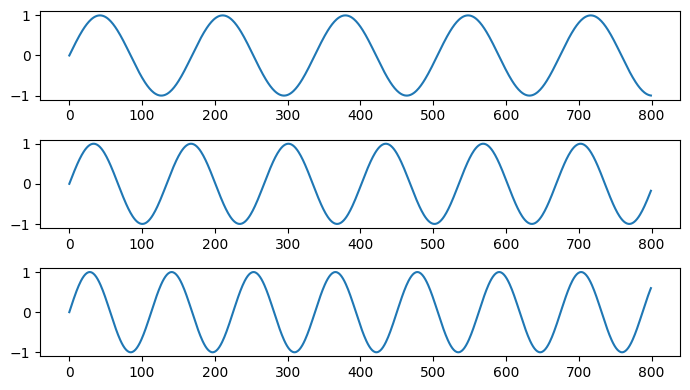

In [ ]:
def note2freq(note_number: int, A4: float = 440.) -> float:
    """midiノートナンバーを周波数に変換する"""
    return A4 * 2**((note_number - 69) / 12)

sr = 44100
y1 = sin_wave(note2freq(60), sr=sr)
y2 = sin_wave(note2freq(64), sr=sr)
y3 = sin_wave(note2freq(67), sr=sr)

plt.figure(figsize=(7, 4))
for i in range(1, 4):
    plt.subplot(3, 1, i)
    exec(f'plt.plot(y{i}[:800])')
plt.tight_layout()

周波数の異なる3つの波を用意した。全部足してみる。

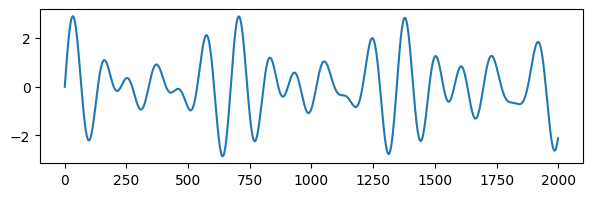

In [ ]:
y = y1 + y2 + y3
plt.plot(y[:2000])
Audio(y, rate=sr)

### モノラルとステレオ

2つのスピーカーで**同じ音**を鳴らす：**モノラル**  
2つのスピーカーで**違う音**を鳴らす：**ステレオ**

ステレオの場合、2次元の配列で表す必要がある。

<br>

2つの音を作った

In [ ]:
import scipy
from scipy import signal

In [ ]:
sec = 2
t = np.linspace(0, sec, sr*sec)
L = signal.chirp(t, 0, sec, 880)
R = np.flip(L)
display(Audio(L, rate=sr))
display(Audio(R, rate=sr))

これを合成して一つの音源にするのがモノラル  
モノラルでは左右のスピーカーで同じ音を鳴らしている

In [ ]:
y = L + R
Audio(y, rate=sr)

左右に分けて再生するのがステレオ

In [ ]:
Audio((L, R), rate=sr)

### チップチューン (おまけ)

(ちょっとしたおまけ)  
ファミコン音楽を作る

<br>

ファミコンでは3種類の音源チップから音を鳴らしていた (3種類の音しか鳴らせない)  
この3種類という制限で作られた音楽をチップチューンというらしい

**参考**  
[Pythonでゲーム音楽（チップチューン）の基本波形を生成（サイン波，矩形波，のこぎり波，三角波，白色雑音） - Wizard Notes](https://www.wizard-notes.com/entry/python/basic-waveforms)

<br>

チップチューンで使われる3種類の音は以下の3つ

#### 矩形波

矩形波 (くけいは)
方形波ともいうらしい

[scipy.signal.square — SciPy v1.8.0 Manual](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.square.html)

こんな波形

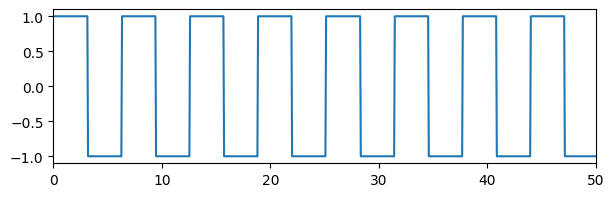

In [ ]:
freq, sr, sec = 440, 44100, 1
t = np.linspace(0, 2*np.pi * freq, sr*sec)
y = signal.square(t)
plt.plot(t, y)
plt.xlim(0, 50)
Audio(y, rate=sr)

<br>

#### 三角波

[scipy.signal.sawtooth — SciPy v1.8.0 Manual](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.sawtooth.html)

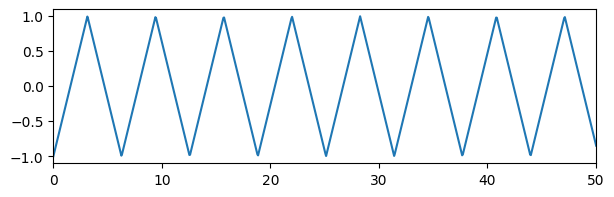

In [ ]:
freq, sr, sec = 440, 44100, 1
t = np.linspace(0, 2*np.pi * freq, sr*sec)
y = signal.sawtooth(t, 0.5)
plt.plot(t, y)
plt.xlim(0, 50)
Audio(y, rate=sr)

<br>

#### ホワイトノイズ

正規分布に従って配列を作るとホワイトノイズになるらしい

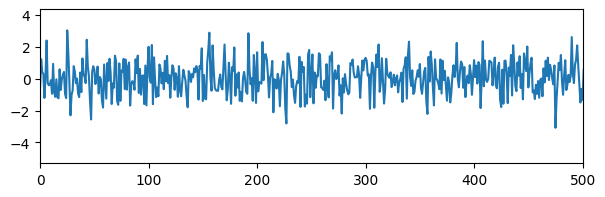

In [ ]:
sr, sec = 44100, 1
y = np.random.randn(sr*sec)
plt.plot(y)
plt.xlim(0, 500)
Audio(y, rate=sr)

<br>

#### 音楽を作ろう

music21というライブラリを使ってmidiファイルから音を作る  
(授業で使ったやつの流用)

[music21 Documentation — music21 Documentation](https://web.mit.edu/music21/doc/)

In [ ]:
import music21 as m

In [ ]:
def square_wave(freq, sec=1, sr=44100, amp=1):
    t = np.linspace(0, 2*np.pi * freq * sec, int(sr*sec))
    return amp * signal.square(t)

def triangle_wave(freq, sec=1, sr=44100, amp=1.5):
    t = np.linspace(0, 2*np.pi * freq * sec, int(sr*sec))
    return amp * signal.sawtooth(t, 0.5)

instruments = [square_wave, square_wave, triangle_wave]

In [ ]:
def note_num(note):
    """music21のNoteオブジェクトからmidiノートナンバーを返す関数"""
    octave = note.octave
    if '-' in note.name:
        pitch = \
            ('C', 'D-', 'D', 'E-', 'E', 'F', 'G-', 'G', 'A-', 'A', 'B-', 'B') \
                .index(note.name)
    else:
        pitch = \
            ('C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B') \
                .index(note.name)

    return 12 + 12*octave + pitch 


def wave_write(path, bpm, sr=44100):
    """midiファイルから音楽を生成する"""
    # midiファイル読み込み
    stream = m.converter.parse(path)
    
    # トラックごとの振幅データの格納
    y_list = []
    
    # 全トラック
    for part, instrument in zip(stream, instruments):
        
        # トラック全体の振幅データ
        measure_y = np.array([])
        
        # 全小節
        for measure in part:
            # 全イベント
            for event in measure:
                # ノート（chord, note）か休符（rest）じゃなかったらスキップ
                # .pitchesだとrestが取得できないためこの手法
                if type(event) not in [m.note.Note, m.note.Rest, m.chord.Chord]:
                    continue

                # 音符の長さと秒数
                qlength = event.quarterLength
                sec = qlength * (60 / bpm)
                
                # 休符だった場合
                if type(event) == m.note.Rest:
                    zero = np.zeros(int(sec*sr))
                    measure_y = np.append(measure_y, zero)
                    continue
                
                # 和音内の全ての音（単音でも動く）
                chord_y = np.zeros(int(sr*sec))
                for note in event.pitches:
                    # 周波数の取得
                    freq = note2freq(note_num(note))
                    
                    # 和音の波の生成
                    chord_y += instrument(freq, sec=sec, sr=sr)
                
                # プツプツ鳴らないように0で終わるようにする
                # 末尾100個をフェードアウト
                e = 200
                chord_y = np.append(
                    chord_y[:-e], chord_y[-e:] * np.linspace(1, 0, e))
                
                # 和音の波を追加
                measure_y = np.append(measure_y, chord_y)
        
        # リストに格納
        y_list.append(measure_y)
        
    # 各トラックの振幅データの長さを揃える
    lenght = min(map(len, y_list))
    
    # 結合
    Y = np.array([sum(y) for y in zip(*[l[:lenght] for l in y_list])])

    return Y

In [ ]:
sr = 44100
y = wave_write('midi/jokyoku.mid', 120, sr=sr)
Audio(y, rate=sr)


---

## 2. Pythonで音を扱う

Pythonで音を扱う際に必要な知識をざっくりと

### 音声埋め込み
ipython notebook形式(.ipynb)での音声埋め込み  
→`IPython.display.Audio()`を使用

[Module: display — IPython 8.1.0 documentation](https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html)

In [ ]:
from IPython.display import display
from IPython.display import Audio

`display()`に引数としてAudioオブジェクトを与えることで埋め込みができる  

<br>

音声ファイルの場合 : pathを入力

In [ ]:
path = 'sample-sounds/ohayo.wav'
display(Audio(path))

最後に置かれたオブジェクトは勝手に表示されるのでAudioだけでもいい

In [ ]:
Audio(path)

web上のファイルも可

In [ ]:
Audio('http://pro-video.jp/voice/announce/mp3/ohayo01mayu.mp3')

配列の場合 : numpy配列(np.ndarray)とサンプリングレートを入力

In [ ]:
sr = 44100
y = sin_wave(freq=440, sr=sr)
Audio(y, rate=sr)

`normalize=True`とすると正規化された状態で埋め込まれる。  
デフォルトでTrueになっているため、音量を変更したい場合はFalseと示す必要がある  
(`normalize=False`とする場合、配列の値は-1 ~ 1に収まっている必要がある)

**\*GoogleColabだとIPythonのバージョンが古いのでできません（2022/03）**

In [ ]:
# 音量を 1/10 にする
y *= 0.1
Audio(y, rate=sr, normalize=False)

#### VScodeでの埋め込み

対応していないようです。が、音を再生するだけならできないこともない。

[VSCodeのJupyterでIPython.display.Audio() を使いたい - Qiita](https://qiita.com/miya_ppp/items/31d4358036c9bd1485a9)

### 音声読み込み

音声ファイルをnumpy配列として読み込む  
これをしないと分析ができない

#### soundfile
音声ファイルの読み書きができる。対応している形式などは以下参照。mp3は対応していないので注意。

[SoundFile — PySoundFile 0.10.3post1-1-g0394588 documentation](https://pysoundfile.readthedocs.io/en/latest/)

In [ ]:
import soundfile as sf

配列とサンプリングレートが返される

In [ ]:
path = './sample-sounds/shiningstar.wav'
y, sr = sf.read(path)
print(sr)
y

44100


array([[ 0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00, -3.05175781e-05],
       ...,
       [-6.10351562e-05,  3.05175781e-05],
       [ 9.15527344e-05,  0.00000000e+00],
       [-9.15527344e-05,  0.00000000e+00]])

ステレオ音源の場合、2次元の配列が返される (信号長, チャンネル数)

<br>

`IPython.display.Audio()`で埋め込む配列は、1次元もしくは形状が(チャンネル数, 信号長)の配列でないといけないので、2次元以上の配列をsfで読み込んだ場合は転置が必要

In [ ]:
Audio(y.T, rate=sr)

<br>

#### librosa
いろんな音声解析ができる。音声ファイルの読み書きもできる。こちらもmp3非対応。

[librosa — librosa 0.9.1 documentation](https://librosa.org/doc/latest/index.html)  
[librosa.load —librosa0.9.1ドキュメント](https://librosa.org/doc/latest/generated/librosa.load.html#librosa.load)

In [ ]:
import librosa

sf同様、配列とsrが返される  
返されるsrは、デフォルトでは22050になっており、配列もそれに従ったものが返される

In [ ]:
y, sr = librosa.load(path)
sr

22050

元のファイルのsrに従いたい場合は`sr=None`を記述

In [ ]:
y, sr = librosa.load(path, sr=None)
print(sr)
y

44100


array([ 0.0000000e+00,  0.0000000e+00, -1.5258789e-05, ...,
       -1.5258789e-05,  4.5776367e-05, -4.5776367e-05], dtype=float32)

任意のsrで読み込むこともできる

In [ ]:
sr = 48000
y, _ = librosa.load(path, sr=sr)
y, sr

(array([ 5.4415727e-06, -2.8204747e-06, -1.4639322e-05, ...,
         2.4039353e-05, -6.4049495e-06,  0.0000000e+00], dtype=float32),
 48000)

`mono=True`でモノラル音源としての読み込みが可能 (デフォルト：True)

In [ ]:
y, sr = librosa.load(path, mono=True)
print(y.shape)

y, sr = librosa.load(path, mono=False)
print(y.shape)

(270143,)
(2, 270143)


<br>

#### audiofile

様々なフォーマットに対応したライブラリ。使い方はsfと同じ

[audiofile — audiofile Documentation](https://audeering.github.io/audiofile/api.html)

In [ ]:
import audiofile

In [ ]:
y, sr = audiofile.read(path)
print(sr)
print(y.shape)
y

44100
(2, 540286)


array([[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        -6.1035156e-05,  9.1552734e-05, -9.1552734e-05],
       [ 0.0000000e+00,  0.0000000e+00, -3.0517578e-05, ...,
         3.0517578e-05,  0.0000000e+00,  0.0000000e+00]], dtype=float32)

mp3も対応

**Q. 結局どれ使えばいいの？**  
- 困ったらsf
- 解析を行う場合は一次元になっていた方が楽なのでlibrosa
- mp3を読み込みたい場合はaudiofile